In [83]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt 
pd.options.display.max_columns=100
pd.options.display.float_format = '{:.2f}'.format

In [84]:
# Set the main's file name and location
#mainFile="TextFED/fhlmc_sf2020c_loans.txt"
mainFile="TextFED/10k.txt"

# Reading the main(fixed width text)file into a dataframe
df=pd.read_fwf(mainFile, header=None, names=[])


In [85]:
# Renaming the columns
df.rename(columns={0:'EnterpriseF', 1:'RecordN', 2:'PostCode', 3:'MSACode', 4:'State_County_Code', 5:'TrackN',6: 'PcntMinority',7:'MedianIncone', 8:'LocAredMdIncome', 10: 'BorrIncome', 11:'AMFI', 14:'LoanPurp', 17:'FirstTHB', 23:'BorrEthn', 30:'BorrGender', 32: 'BorrAge', 37: 'PropType', 39: '62_Older', 44: 'NofUnits', 50: 'CreditScore', 56: 'PropValue', 61: 'PersisPovertyA', 62:'HighOppArea'}, inplace=True)

# Dropping columns I dont need
df.drop(df.columns[[9,12,13,15,16,18,19,20,21,22,24,25,26,27,28,29,31,33,34,35,36,38,40,41,42,43,45,46,47,48,49,51,52,53,54,55,57,58,59,60,63]], axis=1, inplace = True)

df



,EnterpriseF,RecordN,PostCode,MSACode,State_County_Code,TrackN,PcntMinority,MedianIncone,LocAredMdIncome,BorrIncome,AMFI,LoanPurp,FirstTHB,BorrEthn,BorrGender,BorrAge,PropType,62_Older,NofUnits,CreditScore,PropValue,PersisPovertyA,HighOppArea
0,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0
1,2,2,34,35620,39,38202,16.77,220357,91078,278000,96500,1,2,2,1,3,1,0,1,3,885000,0,1
2,2,3,18,14020,105,1305,6.18,74261,67820,60000,71800,2,2,2,1,2,1,0,1,99,305000,0,0
3,2,4,48,41700,91,310608,21.69,57578,69611,187000,72200,7,2,3,1,4,1,0,1,99,665000,0,0
4,2,5,6,41860,1,427600,76.87,58634,117070,251000,127900,2,2,3,1,4,1,0,1,1,985000,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2,996,41,38900,5,22707,17.52,107393,85495,108000,92100,2,2,2,2,3,1,0,1,3,905000,0,0
9996,2,997,37,39580,183,53803,11.11,170625,88590,149000,94100,2,2,2,1,3,1,0,1,1,575000,0,0
9997,2,998,20,45820,177,3902,6.60,88455,71937,191000,77700,7,2,2,1,4,1,0,1,1,205000,0,1
9998,2,999,42,10900,95,17606,17.51,113947,78537,109000,80400,2,2,2,1,3,1,0,1,99,515000,0,0


In [86]:
# Set the County codes file name and location
countyFile="TextFED/STCNTY_2020.txt"

# Read the main fixed width text file into a dataframe
countyDF=pd.read_fwf(countyFile, header=None, names=[])

# Rename the columns
countyDF.rename(columns={0:'PostCode', 1:'StateCode', 2:'TownCode', 3:'Town'}, inplace=True)

countyDF

,PostCode,StateCode,TownCode,Town
0,1,AL,1,AUTAUGA
1,1,AL,3,BALDWIN
2,1,AL,5,BARBOUR
3,1,AL,7,BIBB
4,1,AL,9,BLOUNT
...,...,...,...,...
3224,72,PR,151,YABUCOA MUNICIPIO
3225,72,PR,153,YAUCO MUNICIPIO
3226,78,VI,10,ST. CROIX ISLAND
3227,78,VI,20,ST. JOHN ISLAND


In [87]:
# Set the Zipcodes file name and location
zipcodeFile="TextFED/MSA_2020.txt"

# Read the key-value pair text file into a dataframe
zipDF=pd.read_fwf(zipcodeFile, header=None, delimiter="=", names=[])

# Rename the columns
zipDF.rename(columns={0:'MSACode', 1:'State_County'}, inplace=True)

zipDF

,MSACode,State_County
0,0,'UNABLE TO GEOCODE THE LOCATION'
1,10180,"'Abilene, TX MSA'"
2,10380,"'Aguadilla-Isabela, PR MSA'"
3,10420,"'Akron, OH MSA'"
4,10500,"'Albany, GA MSA'"
...,...,...
389,49620,"'York-Hanover, PA MSA'"
390,49660,"'Youngstown-Warren-Boardman, OH-PA MSA'"
391,49700,"'Yuba City, CA MSA'"
392,49740,"'Yuma, AZ MSA'"


In [88]:
# Merge "main" df with County df
tempDF = df.merge(countyDF, on='PostCode', how='left')

# Merge "tempDF" df with ZIP df
mergedDF = tempDF.merge(zipDF, on='MSACode', how='left')

mergedDF



,EnterpriseF,RecordN,PostCode,MSACode,State_County_Code,TrackN,PcntMinority,MedianIncone,LocAredMdIncome,BorrIncome,AMFI,LoanPurp,FirstTHB,BorrEthn,BorrGender,BorrAge,PropType,62_Older,NofUnits,CreditScore,PropValue,PersisPovertyA,HighOppArea,StateCode,TownCode,Town,State_County
0,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0,WA,1,ADAMS,"'Seattle-Tacoma-Bellevue, WA MSA'"
1,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0,WA,3,ASOTIN,"'Seattle-Tacoma-Bellevue, WA MSA'"
2,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0,WA,5,BENTON,"'Seattle-Tacoma-Bellevue, WA MSA'"
3,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0,WA,7,CHELAN,"'Seattle-Tacoma-Bellevue, WA MSA'"
4,2,1,53,42660,61,51923,33.07,110000,99927,231000,106900,2,2,2,1,2,1,0,1,2,565000,0,0,WA,9,CLALLAM,"'Seattle-Tacoma-Bellevue, WA MSA'"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
782305,2,0,25,49340,27,728300,6.38,109863,91102,132000,95300,1,2,2,1,3,1,0,1,3,455000,0,0,MA,19,NANTUCKET,"'Worcester, MA-CT MSA'"
782306,2,0,25,49340,27,728300,6.38,109863,91102,132000,95300,1,2,2,1,3,1,0,1,3,455000,0,0,MA,21,NORFOLK,"'Worcester, MA-CT MSA'"
782307,2,0,25,49340,27,728300,6.38,109863,91102,132000,95300,1,2,2,1,3,1,0,1,3,455000,0,0,MA,23,PLYMOUTH,"'Worcester, MA-CT MSA'"
782308,2,0,25,49340,27,728300,6.38,109863,91102,132000,95300,1,2,2,1,3,1,0,1,3,455000,0,0,MA,25,SUFFOLK,"'Worcester, MA-CT MSA'"


pd.concat(
    objs=(iDF.set_index('name') for iDF in (df1, df2, df3)),
    axis=1, 
    join='inner'
).reset_index()

In [89]:
import seaborn as sns
import matplotlib.pylab as plt
%matplotlib inline 

In [90]:
mergedDF.dtypes

EnterpriseF            int64
RecordN                int64
PostCode               int64
MSACode                int64
State_County_Code      int64
TrackN                 int64
PcntMinority         float64
MedianIncone           int64
LocAredMdIncome        int64
BorrIncome             int64
AMFI                   int64
LoanPurp               int64
FirstTHB               int64
BorrEthn               int64
BorrGender             int64
BorrAge                int64
PropType               int64
62_Older               int64
NofUnits               int64
CreditScore            int64
PropValue              int64
PersisPovertyA         int64
HighOppArea            int64
StateCode             object
TownCode               int64
Town                  object
State_County          object
dtype: object

In [91]:
mergedDF.columns

Index(['EnterpriseF', 'RecordN', 'PostCode', 'MSACode', 'State_County_Code',
       'TrackN', 'PcntMinority', 'MedianIncone', 'LocAredMdIncome',
       'BorrIncome', 'AMFI', 'LoanPurp', 'FirstTHB', 'BorrEthn', 'BorrGender',
       'BorrAge', 'PropType', '62_Older', 'NofUnits', 'CreditScore',
       'PropValue', 'PersisPovertyA', 'HighOppArea', 'StateCode', 'TownCode',
       'Town', 'State_County'],
      dtype='object')

In [92]:
mergedDF.describe()

,EnterpriseF,RecordN,PostCode,MSACode,State_County_Code,TrackN,PcntMinority,MedianIncone,LocAredMdIncome,BorrIncome,AMFI,LoanPurp,FirstTHB,BorrEthn,BorrGender,BorrAge,PropType,62_Older,NofUnits,CreditScore,PropValue,PersisPovertyA,HighOppArea,TownCode
count,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00,782310.00
mean,2.00,501.01,30.04,35160.47,115.19,225122.90,28.82,97796.45,79129.80,124965.33,83505.36,2.60,1.87,2.13,1.45,3.59,1.00,0.13,1.02,34.60,409808.38,0.06,0.20,126.99
std,0.00,286.22,16.77,23393.23,117.67,312698.93,22.92,41449.81,24143.31,83451.71,15372.11,2.13,0.35,0.79,0.65,1.32,0.05,0.35,0.17,45.86,306697.86,0.24,0.40,130.22
min,2.00,0.00,1.00,10180.00,1.00,0.00,1.02,20405.00,41923.00,0.00,45100.00,1.00,1.00,1.00,1.00,1.00,1.00,0.00,1.00,1.00,35000.00,0.00,0.00,1.00
25%,2.00,253.00,13.00,19100.00,41.00,11500.00,10.87,70353.00,69867.00,71000.00,74000.00,1.00,2.00,2.00,1.00,3.00,1.00,0.00,1.00,1.00,245000.00,0.00,0.00,41.00
50%,2.00,504.00,29.00,31080.00,85.00,50205.00,21.95,91821.00,77320.00,106000.00,82200.00,2.00,2.00,2.00,1.00,3.00,1.00,0.00,1.00,3.00,345000.00,0.00,0.00,89.00
75%,2.00,747.00,48.00,41180.00,139.00,390700.00,40.55,117659.00,84849.00,154000.00,89100.00,2.00,2.00,2.00,2.00,5.00,1.00,0.00,1.00,99.00,505000.00,0.00,0.00,159.00
max,2.00,999.00,66.00,99999.00,830.00,979700.00,999.00,999999.00,999999.00,999998.00,139800.00,7.00,9.00,9.00,4.00,9.00,2.00,9.00,4.00,99.00,9999999.00,1.00,1.00,840.00


In [93]:
missing_data = mergedDF.isnull().sum()
missing_data #no missing values 

EnterpriseF          0
RecordN              0
PostCode             0
MSACode              0
State_County_Code    0
TrackN               0
PcntMinority         0
MedianIncone         0
LocAredMdIncome      0
BorrIncome           0
AMFI                 0
LoanPurp             0
FirstTHB             0
BorrEthn             0
BorrGender           0
BorrAge              0
PropType             0
62_Older             0
NofUnits             0
CreditScore          0
PropValue            0
PersisPovertyA       0
HighOppArea          0
StateCode            0
TownCode             0
Town                 0
State_County         0
dtype: int64

In [94]:
mergedDF['BorrEthn'].value_counts(normalize = True)

2   0.76
3   0.15
1   0.08
9   0.01
Name: BorrEthn, dtype: float64

In [95]:
pip install tabulate 

Note: you may need to restart the kernel to use updated packages.


In [96]:
from tabulate import tabulate

#most common type 
df['num-of-doors'].value_counts().idxmax()

In [97]:
mergedDF['HighOppArea'].value_counts(normalize = True).to_frame()
#about 20% or properties are in high opportunity area 

,HighOppArea
0,0.80
1,0.20


In [98]:
mergedDF.PropType.value_counts(normalize = True)

1   1.00
2   0.00
Name: PropType, dtype: float64

<AxesSubplot:xlabel='BorrGender', ylabel='MedianIncone'>

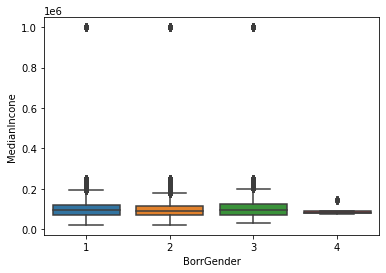

In [99]:
sns.boxplot(x="BorrGender", y="MedianIncone", data=mergedDF)

In [100]:
df_group_one = mergedDF[['BorrGender','PropValue','MedianIncone','BorrIncome']]

In [101]:
df_group_one = df_group_one.groupby(['BorrGender'],as_index=False).mean()
df_group_one

,BorrGender,PropValue,MedianIncone,BorrIncome
0,1,423807.61,98527.11,131850.29
1,2,373319.18,95460.33,107952.10
2,3,427278.58,100221.64,130612.77
3,4,389207.32,87033.03,71189.02


In [102]:
mergedDF.AMFI.mean() #Area Median Family Income  

83505.36373049047


#Python program to illustrate
#plotting using Swarmplot
  
#importing the required module
import matplotlib.pyplot as plt
import seaborn as sns
  
#use to set style of background of plot
sns.set(style="whitegrid")
  
#loading data-set
iris = sns.load_dataset('iris')
  
#plotting strip plot with seaborn
#deciding the attributes of dataset on
#which plot should be made
ax = sns.swarmplot(x='species', y='sepal_length', data=iris)
  
#giving title to the plot
plt.title('Graph')
  
#function to show plot
plt.show()

#barplot
import seaborn as sns 
  
#reading the dataset 
df = sns.load_dataset('tips') 
  
#change the estimator from mean to
#standard deviation 
sns.barplot(x ='sex', y ='total_bill', data = df,  
            palette ='plasma')

#count plot is similar to box plot, it takes a categorical data and couts each occurance  
  
#reading the dataset 
df = sns.load_dataset('tips') 
  
sns.countplot(x ='sex', data = df) 

<AxesSubplot:xlabel='BorrGender', ylabel='count'>

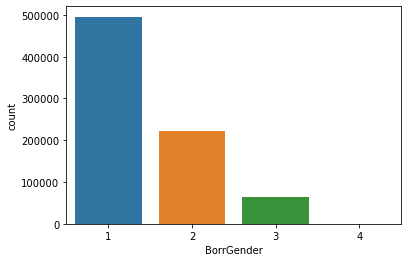

In [103]:
sns.countplot(x ="BorrGender", data =mergedDF) 

<AxesSubplot:xlabel='BorrEthn', ylabel='count'>

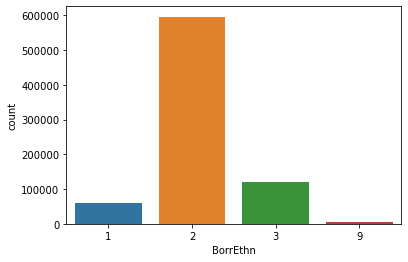

In [144]:
sns.countplot(x ="BorrEthn", data =mergedDF) 

In [104]:
bar_data = mergedDF.groupby(['StateCode'])['PropValue'].mean()


In [105]:
bar_data

StateCode
AK    361500.00
AL    320555.56
AR    283437.50
AZ    401831.96
CA    702878.40
CO    532724.55
CT    361632.65
DC    734523.81
DE    381500.00
FL    382289.72
GA    366773.05
GU    745000.00
HI    561521.74
IA    395406.97
ID    387816.90
IL    357690.48
IN    273532.11
KS    268513.51
KY    280315.32
LA    304634.15
MA    561705.88
MD    472383.97
ME    407000.00
MI    294829.55
MN    338441.86
MO    306684.21
MS    306562.50
MT    404705.88
NC    367730.77
ND   1396111.00
NE    264508.20
NH    394642.86
NJ    484182.16
NM    327285.71
NV    383373.98
NY    531747.97
OH    281559.14
OK    311779.66
OR    453341.97
PA    323916.08
RI    409285.71
SC    331060.61
SD    331296.30
TN    349339.62
TX    358854.66
UT    434295.15
VA    491784.57
VT    385555.56
WA    553338.11
WI    391441.17
WV    278076.92
WY    388157.89
Name: PropValue, dtype: float64

In [106]:
import plotly.express as px
import plotly.graph_objects as go
fig = px.bar(bar_data, y= 'PropValue', title='Property Values') 
fig.show()

In [107]:
fig = px.histogram(mergedDF, x= "MedianIncone")
fig.show()

In [129]:
bar_data2 = mergedDF.groupby(['StateCode'])["PcntMinority"].mean().reset_index()
bar_data2.drop(11, axis = 0, inplace = True )
#dropping outlier GU 

In [130]:
fig = px.bar(bar_data2,x = "StateCode", y = "PcntMinority", title='Percentage Minority') 
fig.show()

In [131]:
mergedDF["NofUnits"].value_counts(normalize = True).to_frame()

,NofUnits
1,0.99
2,0.01
4,0.00
3,0.00


In [132]:
mergedDF['PropType'].value_counts(normalize = True)
#99.8% were one to four family properties 

1   1.00
2   0.00
Name: PropType, dtype: float64

In [133]:
Subset = mergedDF[['StateCode','MedianIncone']]

In [134]:
Subset

,StateCode,MedianIncone
0,WA,110000
1,WA,110000
2,WA,110000
3,WA,110000
4,WA,110000
...,...,...
782305,MA,109863
782306,MA,109863
782307,MA,109863
782308,MA,109863


In [139]:
df_states = Subset.groupby('StateCode')['MedianIncone'].mean().reset_index()
df_states .drop(11, axis = 0, inplace = True )

In [140]:
#df_states

,StateCode,MedianIncone
0,AK,91810.95
1,AL,86620.89
2,AR,91104.59
3,AZ,89094.65
4,CA,103716.89
5,CO,104080.91
6,CT,116403.79
7,DC,128548.81
8,DE,92257.10
9,FL,82179.56


In [1]:
fig = px.scatter(df_states, x="StateCode", y="MedianIncone", size="MedianIncone",
                 hover_name="StateCode", title='Median Income Per State', size_max=40)
fig.show()

NameError: name 'px' is not defined